# **Advanced Lane Detection**

In [1]:
%matplotlib inline
import cv2
import glob
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip
from os import path
from utils.calibration import calibrate_camera, find_chessboard_corners, read_images, undistort_chessboard_imgs, undistort_imgs
from utils.detection import lane_curvature, hist_lane_detection
from utils.perspective import inverse_transform_perspective, transform_perspective
from utils.pipeline import Pipeline
from utils.threshold import abs_sobel_threshold, direction_threshold, magnitude_threshold, threshold_transforms

## Helper functions

In [2]:
def plot_color_imgs(img_list, rows, cols):
    plt.figure(figsize=(18,9))
    for i, img in enumerate(img_list, start=1):
        plt.subplot(rows, cols, i)
        plt.tight_layout()
        plt.tick_params(axis='both', which='both', bottom='off', labelbottom='off',
                        left='off', labelleft='off')
        plt.imshow(img)

In [3]:
def plot_grayscale_imgs(img_list, rows, cols):
    plt.figure(figsize=(20,20))
    end_index = (rows * cols) + 1
    i = 1
    for img in img_list:
        plt.subplot(rows, cols, i)
        plt.tight_layout()
        plt.tick_params(axis='both', which='both', bottom='off', labelbottom='off',
                        left='off', labelleft='off')
        plt.imshow(img, cmap='gray')
        i += 1
        if i == end_index:
            break

## Calibrate camera using chessboard images

In [4]:
chessboard_dir = './camera_cal'

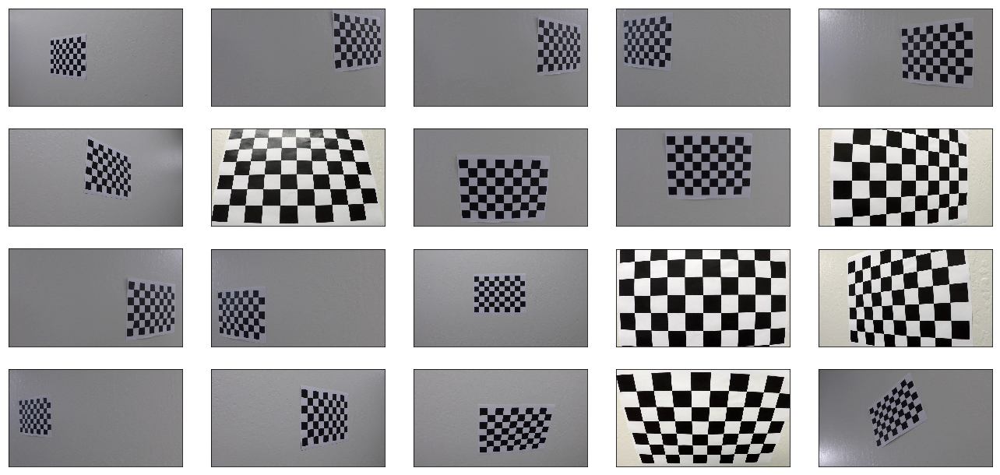

In [5]:
chessboard_imgs = read_images(img_dir=chessboard_dir, color_imgs=True)
plot_color_imgs(chessboard_imgs, 4, 5)

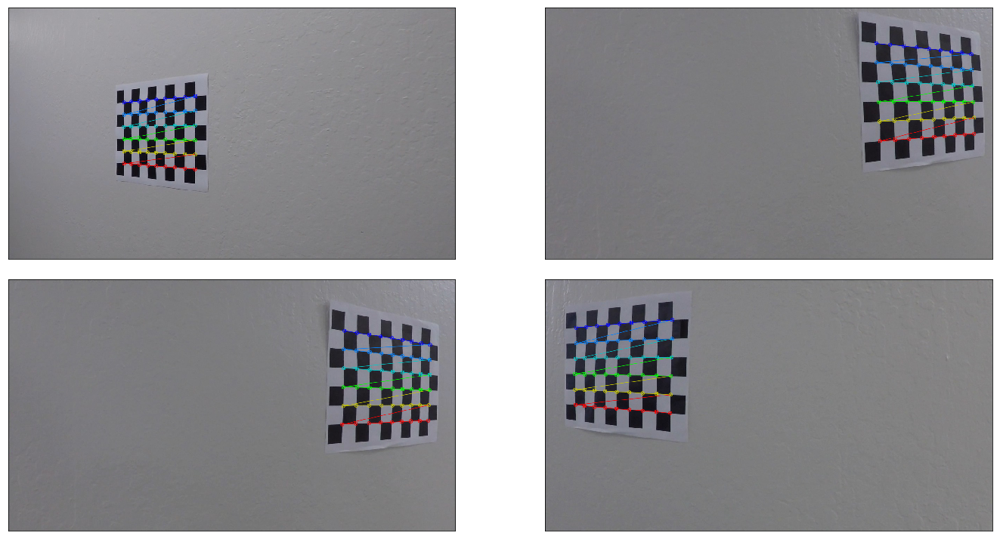

In [6]:
chessboard_size = (9,6)
used_img_indices, obj_points, img_points, grayscale_imgs = find_chessboard_corners(chessboard_dir,
                                                                                   data_for_drawing=True)
plt.figure(figsize=(20,20))
for i in range(len(img_points)):
    plt.subplot(4,2,i+1)
    plt.tight_layout()
    plt.tick_params(axis='both', which='both', bottom='off', labelbottom='off',
                    left='off', labelleft='off')
    cv2.drawChessboardCorners(chessboard_imgs[used_img_indices[i]], chessboard_size, img_points[i], True)
    plt.imshow(chessboard_imgs[used_img_indices[i]])
    if i == 3:
        break

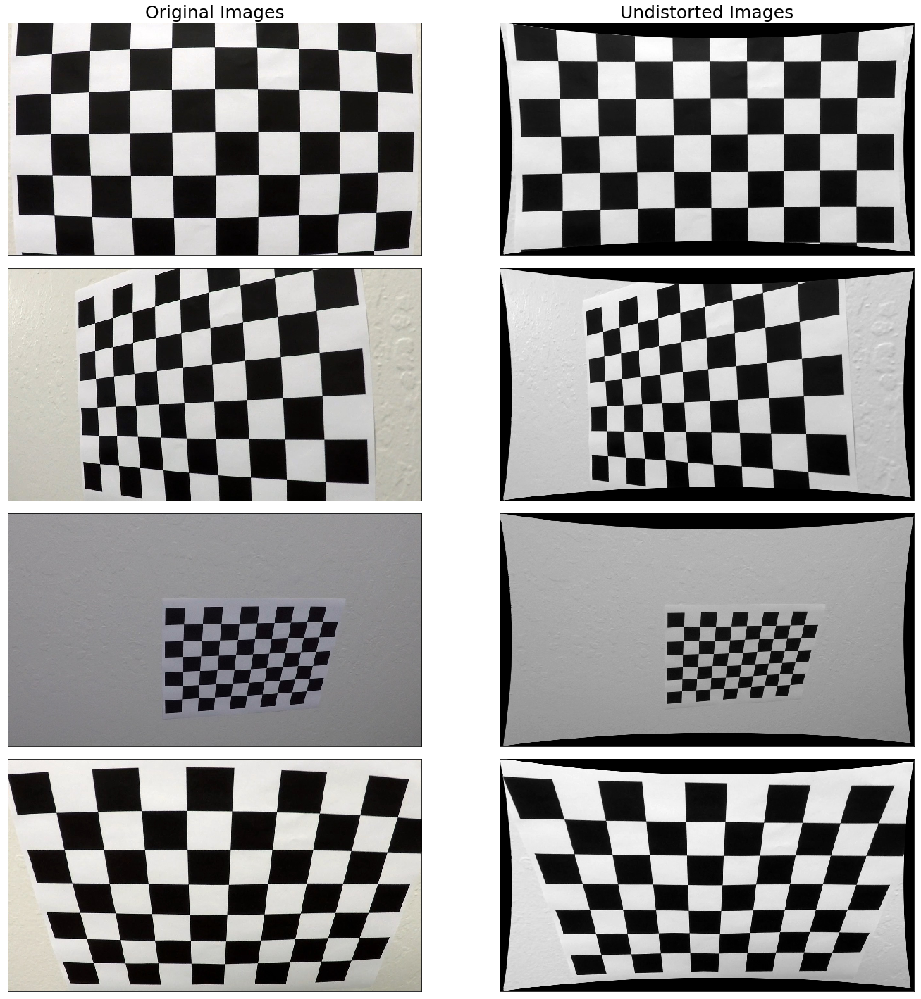

In [7]:
results = undistort_chessboard_imgs(chessboard_dir, grayscale_imgs[1].shape[::-1])
interesting_distortions = [13, 14, 17, 18]
plt.figure(figsize=(20,20))
i = 1
for index in interesting_distortions:
    plt.subplot(4, 2, i)
    if i == 1:
        plt.title('Original Images', {'fontsize': 25})
    plt.tight_layout()
    plt.tick_params(axis='both', which='both', bottom='off', labelbottom='off',
                    left='off', labelleft='off')
    plt.imshow(chessboard_imgs[index], cmap='gray')
    
    i += 1
    plt.subplot(4, 2, i)
    if i == 2:
        plt.title('Undistorted Images', {'fontsize': 25})
    plt.tight_layout()
    plt.tick_params(axis='both', which='both', bottom='off', labelbottom='off',
                    left='off', labelleft='off')
    plt.imshow(results[index], cmap='gray')
    i += 1

## Undistort sample road imagery

In [8]:
sample_road_imgs_dir = './test_images'
sample_road_imgs = read_images(img_dir=sample_road_imgs_dir, color_imgs=True)

In [9]:
chessboard_img_shape = chessboard_imgs[1].shape[1::-1]
_, matrix, dist, _, _ = calibrate_camera(chessboard_dir, chessboard_img_shape)
new_matrix, roi = cv2.getOptimalNewCameraMatrix(matrix, dist, chessboard_img_shape,
                                                1, chessboard_img_shape)
calibration_dict = {'matrix': matrix,
                    'dist': dist,
                    'new_matrix': new_matrix}

In [10]:
undistorted_road_imgs = undistort_imgs(img_dir=sample_road_imgs_dir, calibration_dict=calibration_dict)

{'matrix': array([[1.15693581e+03, 0.00000000e+00, 6.65950782e+02],
       [0.00000000e+00, 1.15213336e+03, 3.88784060e+02],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]]), 'dist': array([[-2.37640816e-01, -8.53716909e-02, -7.90993817e-04,
        -1.15659394e-04,  1.05673882e-01]]), 'new_matrix': array([[989.61572266,   0.        , 673.50153997],
       [  0.        , 979.49035645, 390.2715563 ],
       [  0.        ,   0.        ,   1.        ]])}


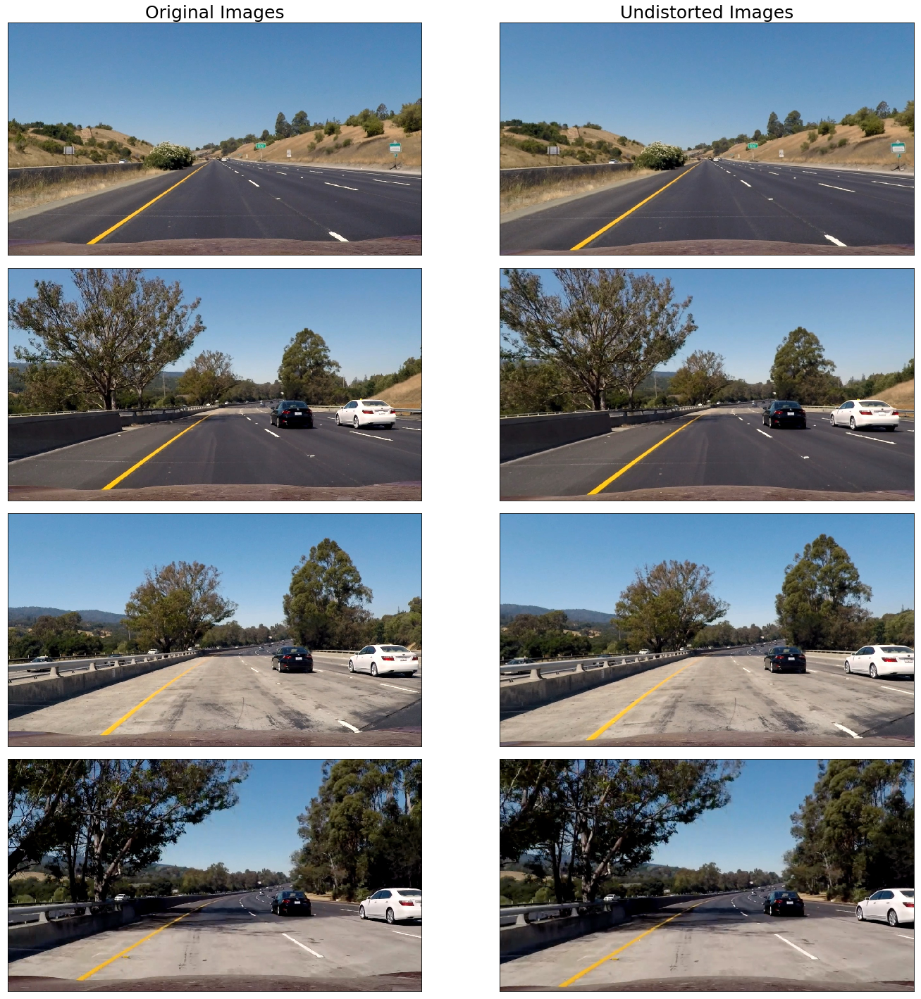

In [11]:
plt.figure(figsize=(20,20))
i = 1
for index, sample_road_img in enumerate(sample_road_imgs):
    plt.subplot(4, 2, i)
    if i == 1:
        plt.title('Original Images', {'fontsize': 25})
    plt.tight_layout()
    plt.tick_params(axis='both', which='both', bottom='off', labelbottom='off',
                    left='off', labelleft='off')
    plt.imshow(sample_road_img)
    
    i += 1
    plt.subplot(4, 2, i)
    if i == 2:
        plt.title('Undistorted Images', {'fontsize': 25})
    plt.tight_layout()
    plt.tick_params(axis='both', which='both', bottom='off', labelbottom='off',
                    left='off', labelleft='off')
    plt.imshow(undistorted_road_imgs[index])
    i += 1
    if i == 9:
        break

## Apply Sobel transforms

In [12]:
sobel_config_dict = {
    'abs_sobel_orient_x': True,
    'abs_sobel_orient_y': False,
    'abs_sobel_kernel': -1,
    'abs_sobel_min': 40,
    'abs_sobel_max': 100,
    'mag': False,
    'mag_kernel': 9,
    'mag_min': 80,
    'mag_max': 200,
    'dir': False,
    'dir_kernel': 9,
    'dir_min': 0.01,
    'dir_max': 0.1,
    'lightness': True,
    'light_min': 150,
    'light_max': 255, 
    'saturation': True,
    'sat_min': 170,
    'sat_max': 255,
    'yellow': True,
    'yellow_min': 200,
    'yellow_max': 255
}

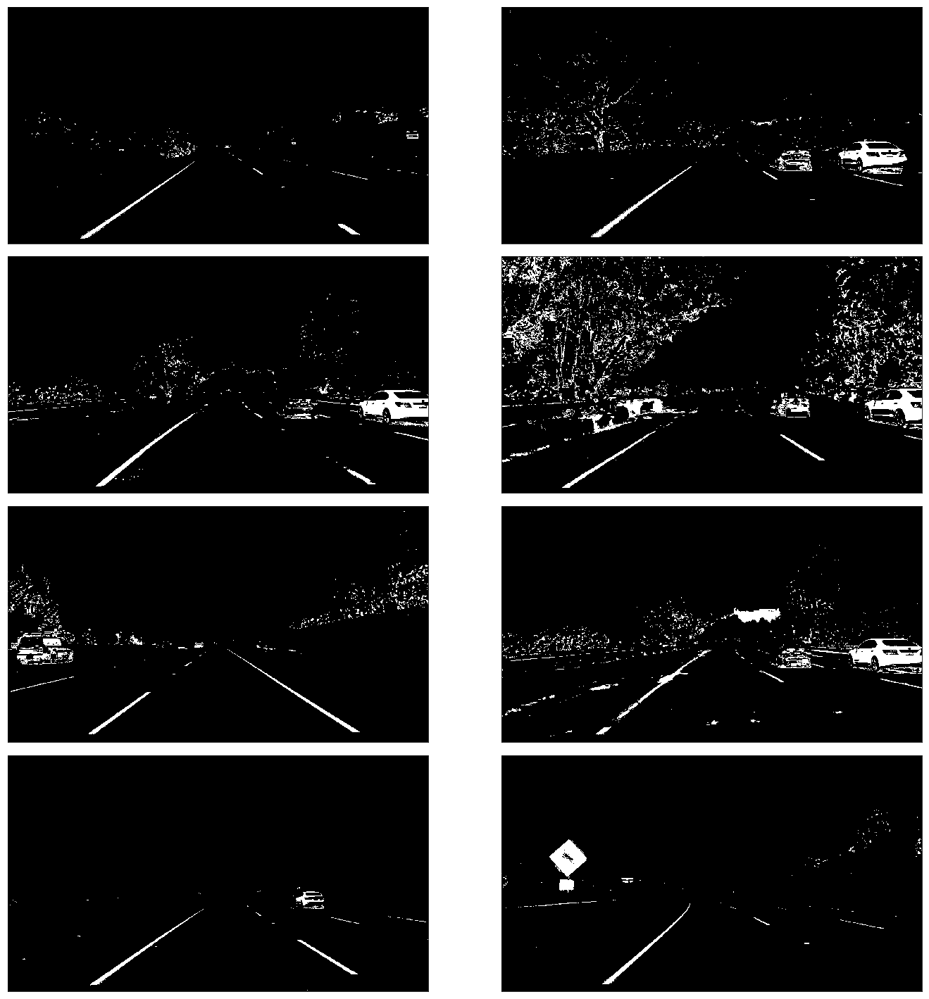

In [13]:
thresholded_road_imgs = threshold_transforms(undistorted_road_imgs, sobel_config_dict)
plot_grayscale_imgs(thresholded_road_imgs, 4, 2)

## Transform image perspective

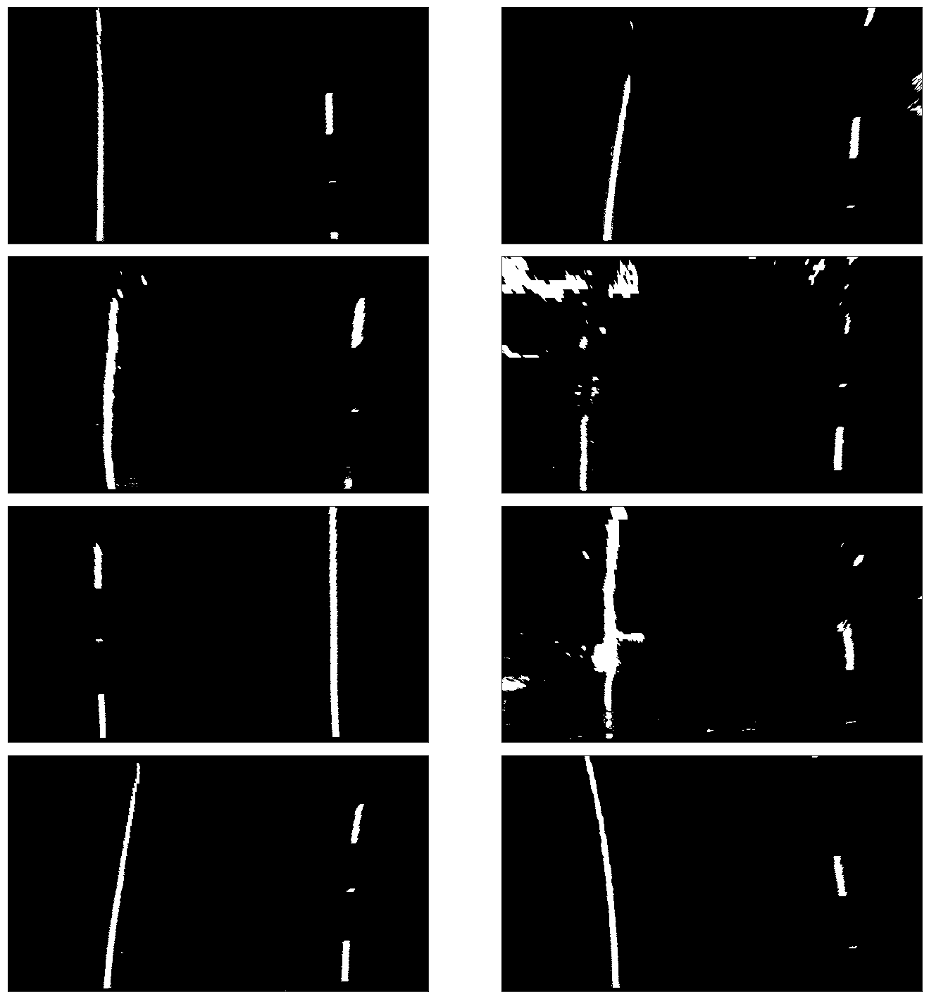

In [14]:
perspective_road_imgs, Ms = transform_perspective(thresholded_road_imgs)
plot_grayscale_imgs(perspective_road_imgs, 4, 2)

## Lane detection

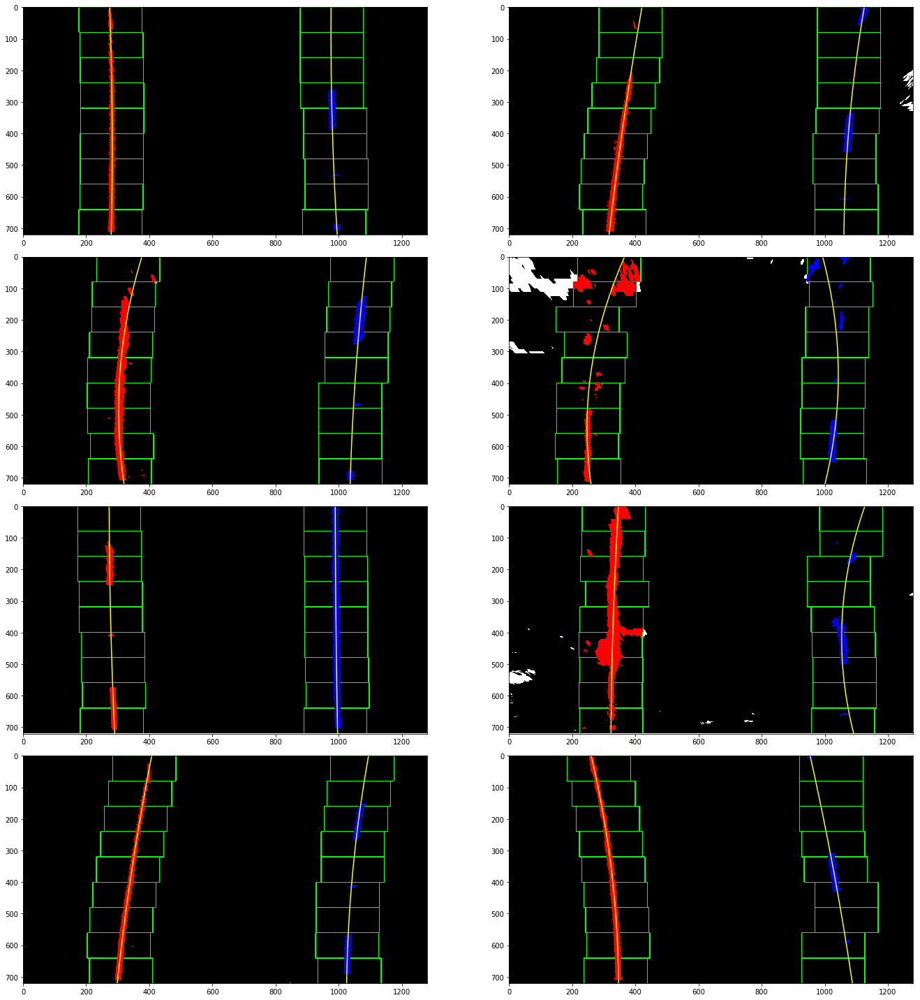

In [15]:
import numpy as np
lane_coordinates = []
plt.figure(figsize=(20,20))
i = 1
for perspective_road_img in perspective_road_imgs:
    plt.subplot(4, 2, i)
    plt.tight_layout()
    lane_coordinates.append((hist_lane_detection(perspective_road_img, visualize=True)))
    i += 1
    if i == 9:
        break
lane_coordinates = np.array(lane_coordinates)

In [16]:
results = []
for pers_road_img in perspective_road_imgs:
    results.append(hist_lane_detection(pers_road_img))

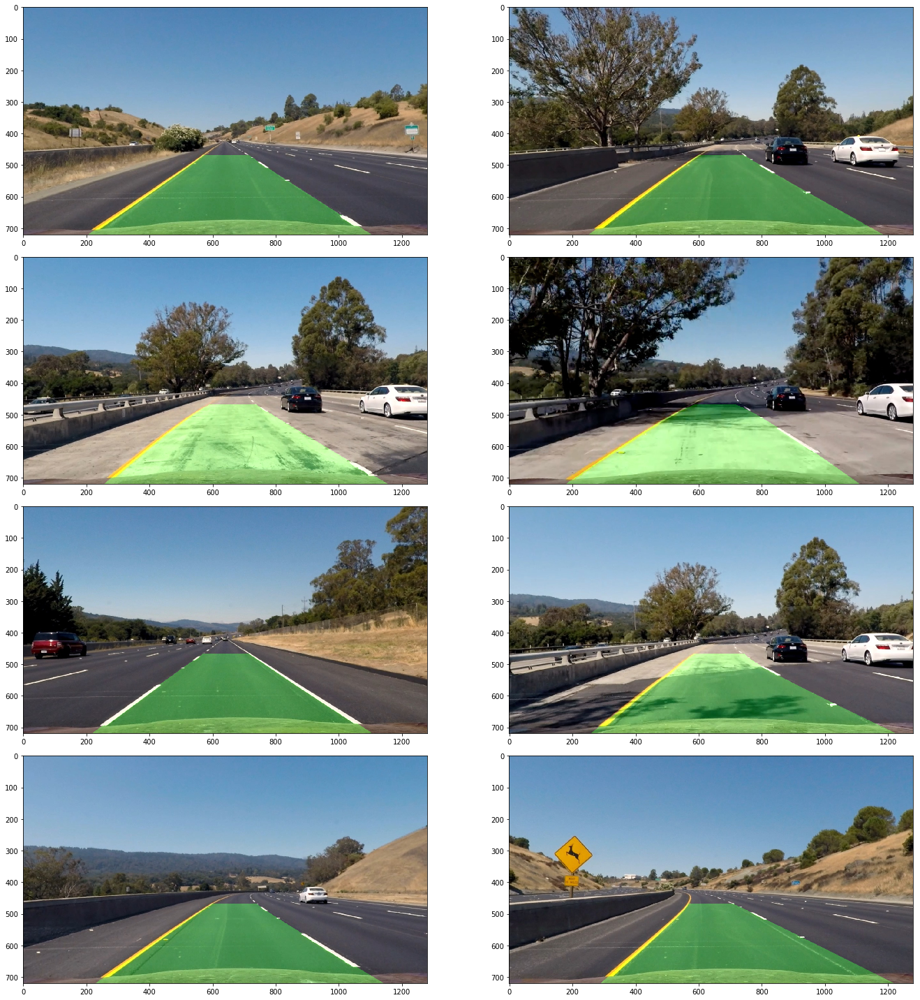

In [17]:
plt.figure(figsize=(20,20))
i = 1
for index, lane_coordinate in enumerate(lane_coordinates):
    plt.subplot(4, 2, i)
    plt.tight_layout()
    fit, pos = results[index]
    inverse_transform_perspective(undistorted_road_imgs[index], perspective_road_imgs[index],
                                  fit[0], fit[1], fit[2], Ms[index], True)
    i += 1
    if i == 9:
        break

## Process video frames

In [18]:
chessboard_dir = './camera_cal'
video_pipeline = Pipeline()
video_pipeline.set_camera_calibration(chessboard_dir)

[MoviePy] >>>> Building video output_video.mp4
[MoviePy] Writing video output_video.mp4


100%|█████████▉| 1260/1261 [03:34<00:00,  6.09it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_video.mp4 



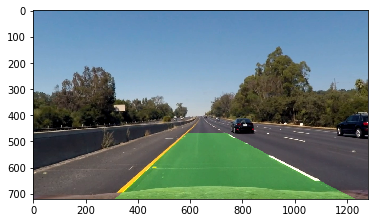

In [19]:
project_video = VideoFileClip('project_video.mp4')
processed_video = project_video.fl_image(video_pipeline.process_img)
processed_video.write_videofile('output_video.mp4', audio=False)